# Récupération de la Data et cleaning 


In [108]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import os

In [109]:
# URLs des fichiers CSV
url_file1 = 'https://raw.githubusercontent.com/trung-hn/video-game-encyclopedia/master/data/game_id.csv'
url_file2 = 'https://raw.githubusercontent.com/trung-hn/video-game-encyclopedia/master/data/game_info.csv'

# Lire les fichiers CSV dans des DataFrames
df_game_id = pd.read_csv(url_file1, header=None)
df_game_info = pd.read_csv(url_file2)


In [110]:
# Créer une nouvelle ligne avec les noms des colonnes
header = pd.DataFrame([['id', 'game_name']], columns=[0, 1])

# Concaténer la nouvelle ligne avec le DataFrame original
df_game_id_with_header = pd.concat([header, df_game_id], ignore_index=True)

# Définir les noms de colonnes en utilisant la première ligne comme en-têtes
df_game_id_with_header.columns = df_game_id_with_header.iloc[0]
df_game_id_with_header = df_game_id_with_header[1:]

# Réinitialiser l'index pour s'assurer qu'il est correct
df_game_id_with_header.reset_index(drop=True, inplace=True)
df_game_id = df_game_id_with_header

In [111]:
df_game_id.head()

,id,game_name
0,3498,grand-theft-auto-v
1,3328,the-witcher-3-wild-hunt
2,4200,portal-2
3,5286,tomb-raider
4,5679,the-elder-scrolls-v-skyrim


In [112]:
df_game_info.head()

,id,slug,name,metacritic,released,tba,updated,website,rating,rating_top,...,developers,genres,publishers,esrb_rating,added_status_yet,added_status_owned,added_status_beaten,added_status_toplay,added_status_dropped,added_status_playing
0,1,dgeneration-hd,D/Generation HD,NaN,2015-10-23,False,2019-09-17T11:58:57,http://dgeneration.net,0.0,0,...,West Coast Software,Adventure||Puzzle,West Coast Software,Everyone 10+,4,88,2,2,0,0
1,10,g-prime,G Prime Into The Rain,NaN,2016-01-06,False,2019-11-06T23:04:19,NaN,0.0,0,...,Soma Games,Simulation||Indie,Immanitas Entertainment||Code-Monkeys,Everyone,2,42,2,0,0,0
2,100,land-sliders,Land Sliders,NaN,2015-09-24,False,2019-10-22T13:56:16,http://prettygreat.com,0.0,0,...,Prettygreat Pty,Adventure||Arcade,Prettygreat Pty,Everyone 10+,0,2,2,0,1,0
3,1000,pixel-gear,Pixel Gear,NaN,2016-10-20,False,2019-08-28T22:16:02,https://www.facebook.com/Geronimo-Interactive-...,0.0,0,...,Oasis Games||Geronimo Interactive,Action||Indie,Geronimo Interactive,Teen,0,1,0,0,0,0
4,10000,gods-and-idols,Gods and Idols,NaN,2016-12-12,False,2019-09-17T13:37:13,http://www.godsandidols.com/,0.0,1,...,Viking Tao,RPG||Strategy||Massively Multiplayer,Viking Tao,NaN,2,79,0,0,0,0


In [113]:
df_game_id.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 664948 entries, 0 to 664947
Data columns (total 2 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   id         664948 non-null  object
 1   game_name  664946 non-null  object
dtypes: object(2)
memory usage: 10.1+ MB


In [114]:
df_game_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 474417 entries, 0 to 474416
Data columns (total 27 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    474417 non-null  int64  
 1   slug                  474415 non-null  object 
 2   name                  474414 non-null  object 
 3   metacritic            4733 non-null    float64
 4   released              450218 non-null  object 
 5   tba                   474417 non-null  bool   
 6   updated               474417 non-null  object 
 7   website               65041 non-null   object 
 8   rating                474417 non-null  float64
 9   rating_top            474417 non-null  int64  
 10  playtime              474417 non-null  int64  
 11  achievements_count    474417 non-null  int64  
 12  ratings_count         474417 non-null  int64  
 13  suggestions_count     474417 non-null  int64  
 14  game_series_count     474417 non-null  int64  
 15  

In [115]:
df_total = pd.merge(df_game_id,
        df_game_info,
        how="left",
        left_on='id',
        right_on='id')
df_total.head()

,id,game_name,slug,name,metacritic,released,tba,updated,website,rating,...,developers,genres,publishers,esrb_rating,added_status_yet,added_status_owned,added_status_beaten,added_status_toplay,added_status_dropped,added_status_playing
0,3498,grand-theft-auto-v,grand-theft-auto-v,Grand Theft Auto V,97.0,2013-09-17,False,2020-09-23T07:10:53,http://www.rockstargames.com/V/,4.48,...,Rockstar North,Action,Rockstar Games||1C-SoftClub,Mature,331.0,8298.0,3533.0,377.0,641.0,497.0
1,3328,the-witcher-3-wild-hunt,the-witcher-3-wild-hunt,The Witcher 3: Wild Hunt,92.0,2015-05-18,False,2020-10-02T00:57:03,https://thewitcher.com/en/witcher3,4.67,...,CD PROJEKT RED,Action||Adventure||RPG,CD PROJEKT RED,Mature,635.0,6766.0,2759.0,517.0,485.0,642.0
2,4200,portal-2,portal-2,Portal 2,95.0,2011-04-18,False,2020-08-03T02:17:38,http://www.thinkwithportals.com/,4.61,...,Valve Software,Shooter||Puzzle,Electronic Arts||Valve,Everyone 10+,386.0,7506.0,3414.0,211.0,324.0,97.0
3,5286,tomb-raider,tomb-raider,Tomb Raider (2013),86.0,2013-03-05,False,2020-08-03T05:49:25,http://www.tombraider.com,4.06,...,Crystal Dynamics,Action||Adventure,Square Enix,Mature,375.0,7299.0,2599.0,149.0,305.0,80.0
4,5679,the-elder-scrolls-v-skyrim,the-elder-scrolls-v-skyrim,The Elder Scrolls V: Skyrim,94.0,2011-11-11,False,2020-07-06T04:26:04,http://elderscrolls.com/,4.42,...,Bethesda Softworks||Bethesda Game Studios,Action||RPG,Bethesda Softworks,Mature,299.0,6716.0,2313.0,246.0,801.0,271.0


In [116]:
df_total.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 664948 entries, 0 to 664947
Data columns (total 28 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    664948 non-null  object 
 1   game_name             664946 non-null  object 
 2   slug                  473977 non-null  object 
 3   name                  473976 non-null  object 
 4   metacritic            4716 non-null    float64
 5   released              449818 non-null  object 
 6   tba                   473979 non-null  object 
 7   updated               473979 non-null  object 
 8   website               64937 non-null   object 
 9   rating                473979 non-null  float64
 10  rating_top            473979 non-null  float64
 11  playtime              473979 non-null  float64
 12  achievements_count    473979 non-null  float64
 13  ratings_count         473979 non-null  float64
 14  suggestions_count     473979 non-null  float64
 15  

In [117]:
df_total2 = df_total.query('name.notna()', engine='python')

In [119]:
df_total2["released"] = pd.to_datetime(df_total2["released"])

current_year = pd.Timestamp.now().year
df_total2['year'] = df_total2['released'].dt.year
df_total2 = df_total2[df_total2['year'] <= current_year]
df_total2['decennie'] = (df_total2['year'] // 10) * 10

C:\Users\Alex\AppData\Local\Temp\ipykernel_2612\1594608999.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Alex\AppData\Local\Temp\ipykernel_2612\1594608999.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Alex\AppData\Local\Temp\ipykernel_2612\1594608999.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

In [120]:
df_total2.head(10)

,id,game_name,slug,name,metacritic,released,tba,updated,website,rating,...,publishers,esrb_rating,added_status_yet,added_status_owned,added_status_beaten,added_status_toplay,added_status_dropped,added_status_playing,year,decennie
0,3498,grand-theft-auto-v,grand-theft-auto-v,Grand Theft Auto V,97.0,2013-09-17,False,2020-09-23T07:10:53,http://www.rockstargames.com/V/,4.48,...,Rockstar Games||1C-SoftClub,Mature,331.0,8298.0,3533.0,377.0,641.0,497.0,2013.0,2010.0
1,3328,the-witcher-3-wild-hunt,the-witcher-3-wild-hunt,The Witcher 3: Wild Hunt,92.0,2015-05-18,False,2020-10-02T00:57:03,https://thewitcher.com/en/witcher3,4.67,...,CD PROJEKT RED,Mature,635.0,6766.0,2759.0,517.0,485.0,642.0,2015.0,2010.0
2,4200,portal-2,portal-2,Portal 2,95.0,2011-04-18,False,2020-08-03T02:17:38,http://www.thinkwithportals.com/,4.61,...,Electronic Arts||Valve,Everyone 10+,386.0,7506.0,3414.0,211.0,324.0,97.0,2011.0,2010.0
3,5286,tomb-raider,tomb-raider,Tomb Raider (2013),86.0,2013-03-05,False,2020-08-03T05:49:25,http://www.tombraider.com,4.06,...,Square Enix,Mature,375.0,7299.0,2599.0,149.0,305.0,80.0,2013.0,2010.0
4,5679,the-elder-scrolls-v-skyrim,the-elder-scrolls-v-skyrim,The Elder Scrolls V: Skyrim,94.0,2011-11-11,False,2020-07-06T04:26:04,http://elderscrolls.com/,4.42,...,Bethesda Softworks,Mature,299.0,6716.0,2313.0,246.0,801.0,271.0,2011.0,2010.0
5,4291,counter-strike-global-offensive,counter-strike-global-offensive,Counter-Strike: Global Offensive,81.0,2012-08-21,False,2020-08-07T06:18:15,http://blog.counter-strike.net/,3.57,...,Valve,Mature,163.0,7821.0,544.0,41.0,1056.0,388.0,2012.0,2010.0
6,12020,left-4-dead-2,left-4-dead-2,Left 4 Dead 2,89.0,2009-11-17,False,2020-12-02T13:36:02,http://www.l4d.com,4.10,...,Electronic Arts||Valve,Mature,250.0,7708.0,1542.0,56.0,634.0,99.0,2009.0,2000.0
7,13536,portal,portal,Portal,90.0,2007-10-09,False,2020-03-08T18:54:32,http://www.whatistheorangebox.com/,4.52,...,Valve,Teen,247.0,6402.0,3088.0,126.0,215.0,45.0,2007.0,2000.0
8,4062,bioshock-infinite,bioshock-infinite,BioShock Infinite,94.0,2013-03-26,False,2020-08-03T02:19:32,http://www.bioshockinfinite.com/,4.39,...,2K Games||Aspyr,Mature,493.0,6242.0,2820.0,238.0,297.0,67.0,2013.0,2010.0
9,802,borderlands-2,borderlands-2,Borderlands 2,89.0,2012-09-18,False,2020-08-07T02:30:06,http://www.borderlands2.com/,4.05,...,2K Games||Aspyr,Mature,388.0,7244.0,1495.0,114.0,788.0,188.0,2012.0,2010.0


# Data Exploration 


In [121]:
df_total2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 449719 entries, 0 to 664947
Data columns (total 30 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   id                    449719 non-null  object        
 1   game_name             449719 non-null  object        
 2   slug                  449719 non-null  object        
 3   name                  449719 non-null  object        
 4   metacritic            4702 non-null    float64       
 5   released              449719 non-null  datetime64[ns]
 6   tba                   449719 non-null  object        
 7   updated               449719 non-null  object        
 8   website               59403 non-null   object        
 9   rating                449719 non-null  float64       
 10  rating_top            449719 non-null  float64       
 11  playtime              449719 non-null  float64       
 12  achievements_count    449719 non-null  float64       
 13  rati

In [122]:
'''
# import pour ydata_profiling
import ydata_profiling
from ydata_profiling import ProfileReport
from ydata_profiling.utils.cache import cache_file

# creation d'un rapport exploratoire de notre dataframe

profile = ProfileReport(df_total2, title="Analyse Générale",html={'style': {'full_width': True}})

# Affichage de notre rapport exploratoire :

profile.to_notebook_iframe()
'''

'\n# import pour ydata_profiling\nimport ydata_profiling\nfrom ydata_profiling import ProfileReport\nfrom ydata_profiling.utils.cache import cache_file\n\n# creation d\'un rapport exploratoire de notre dataframe\n\nprofile = ProfileReport(df_total2, title="Analyse Générale",html={\'style\': {\'full_width\': True}})\n\n# Affichage de notre rapport exploratoire :\n\nprofile.to_notebook_iframe()\n'

In [123]:
df_total2.shape

(449719, 30)

In [124]:
#px.line(df_total2, x="released", y=df_total2.select_dtypes(include='number').columns, title="Titre")

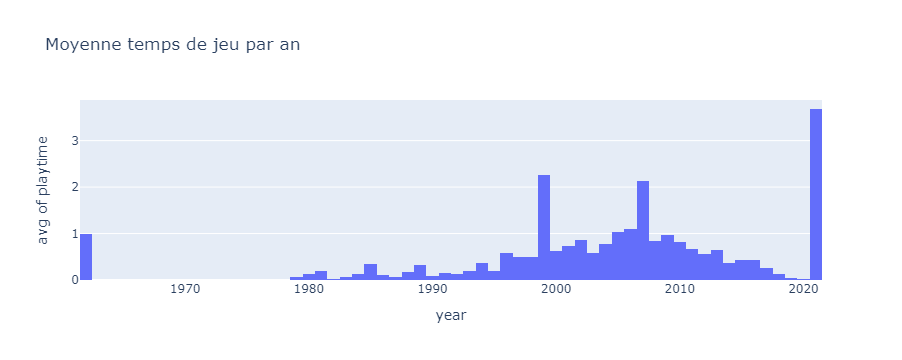

In [125]:
df_clean = df_total2.dropna(subset=['year', 'playtime','rating'])

px.histogram(df_clean, x='year', y='playtime', title='Moyenne temps de jeu par an', histfunc='avg')

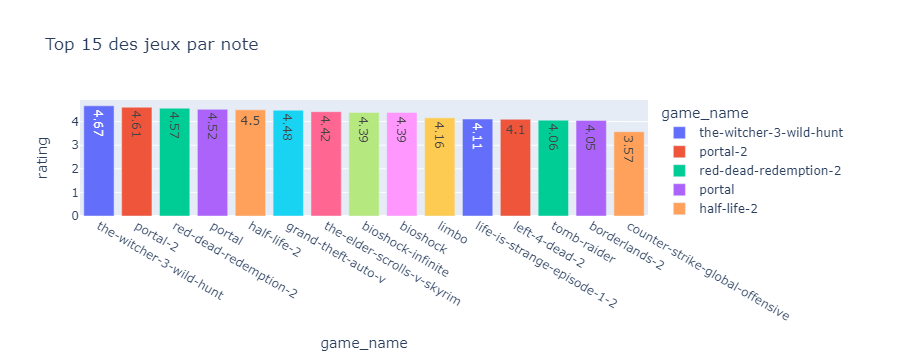

In [126]:
df_limited = df_clean.head(15).sort_values(by='rating', ascending=False).head(15)

px.bar(df_limited,x='game_name',y='rating',color='game_name',text='rating',title ='Top 15 des jeux par note')